# PROJECT :  Creating clusters on global development measurement dataset

### EDA Tasks:
#### Data Cleaning and preprocessing
1) Handling Missing values
1) Handling datatype mismatches(structural errors)
2) Removing Duplicates
3) Managing outliers

#### Data transformation and Feature engineering
1) Scaling and Normalising.
2) Encoding categorical variables.

#### Visualisations
1) Univariate plots: Frequency plots, Bar plots, pie charts, box plots etc
2) Bivariate plots: Scatter plots, Heatmaps, etc
3) Multivariate plots: Pair plots, Correlation heatmaps

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

!pip install scikit-learn-extra
from sklearn_extra.cluster import KMedoids

Defaulting to user installation because normal site-packages is not writeable


In [3]:
df=pd.read_excel("World_development_mesurement.xlsx",sheet_name="world_development")

In [4]:
df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [5]:
df.shape

(2704, 25)

In [6]:
df.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions', 'Country',
       'Days to Start Business', 'Ease of Business', 'Energy Usage', 'GDP',
       'Health Exp % GDP', 'Health Exp/Capita', 'Hours to do Tax',
       'Infant Mortality Rate', 'Internet Usage', 'Lending Interest',
       'Life Expectancy Female', 'Life Expectancy Male', 'Mobile Phone Usage',
       'Number of Records', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Total', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [7]:
df.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

#### Handling mismatched  datatypes:

In [9]:
df.dtypes

Birth Rate                float64
Business Tax Rate          object
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                        object
Health Exp % GDP          float64
Health Exp/Capita          object
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Number of Records           int64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total            int64
Population Urban          float64
Tourism Inbound            object
Tourism Outbound           object
dtype: object

Columns like 'Days to start business', 'GDP', 'HealthExp/Capita' , 'Tourism Inbound' , and 'Tourism Outbound are object
type, so changing them to int or float

In [10]:
cols = ['GDP', 'Health Exp/Capita', 'Tourism Inbound', 'Tourism Outbound']
for col in cols:
    df[col] = df[col].replace('[\$,]', '', regex=True).astype(float)

In [11]:
df.dtypes

Birth Rate                float64
Business Tax Rate          object
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                       float64
Health Exp % GDP          float64
Health Exp/Capita         float64
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Number of Records           int64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total            int64
Population Urban          float64
Tourism Inbound           float64
Tourism Outbound          float64
dtype: object

#### Handling Missing values

In [12]:
df.isnull().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

##### Number of Records -- Metadata, not meaningful for development level

In [13]:
df['Number of Records'].value_counts()
# since it adds nothing in develpoment measurement ,dropping it.

1    2704
Name: Number of Records, dtype: int64

##### Dropping all these columns because they have around 50% missing values

In [14]:
df.drop(['Business Tax Rate','Ease of Business','Hours to do Tax','Number of Records'],axis=1,inplace=True)

In [15]:
df.isnull().sum()

Birth Rate                119
CO2 Emissions             579
Country                     0
Days to Start Business    986
Energy Usage              919
GDP                       210
Health Exp % GDP          309
Health Exp/Capita         309
Infant Mortality Rate     260
Internet Usage            173
Lending Interest          824
Life Expectancy Female    136
Life Expectancy Male      136
Mobile Phone Usage        167
Population 0-14           220
Population 15-64          220
Population 65+            220
Population Total            0
Population Urban           26
Tourism Inbound           368
Tourism Outbound          471
dtype: int64

##### Median imputation for all numeric columns with missing values

In [16]:
cols_with_missing = [
    "Birth Rate", "CO2 Emissions", "Days to Start Business", "Energy Usage",
    "Health Exp % GDP", "Infant Mortality Rate", "Internet Usage",
    "Lending Interest", "Life Expectancy Female", "Life Expectancy Male",
    "Mobile Phone Usage", "Population 0-14", "Population 15-64", "Population 65+",
    "Population Urban","GDP","Health Exp/Capita","Tourism Inbound","Tourism Outbound"
]

for col in cols_with_missing:
    if col in df.columns:
        median_val = df[col].median()
        df[col].fillna(median_val, inplace=True)

In [17]:
#Verify no missing values left
print("Missing values after imputation:")
df.isnull().sum()

Missing values after imputation:


Birth Rate                0
CO2 Emissions             0
Country                   0
Days to Start Business    0
Energy Usage              0
GDP                       0
Health Exp % GDP          0
Health Exp/Capita         0
Infant Mortality Rate     0
Internet Usage            0
Lending Interest          0
Life Expectancy Female    0
Life Expectancy Male      0
Mobile Phone Usage        0
Population 0-14           0
Population 15-64          0
Population 65+            0
Population Total          0
Population Urban          0
Tourism Inbound           0
Tourism Outbound          0
dtype: int64

#### Checking for duplicates:

In [18]:
df.duplicated().sum()  #No duplicates 

0

#### Managing Outliers

In [19]:
df.head()

,Birth Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,87931.0,Algeria,26.0,26998.0,5.479006e+10,0.035,60.0,0.034,0.0,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0
1,0.050,9542.0,Angola,26.0,7499.0,9.129595e+09,0.034,22.0,0.128,0.0,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0
2,0.043,1617.0,Benin,26.0,1983.0,2.359122e+09,0.043,15.0,0.090,0.0,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0
3,0.027,4276.0,Botswana,26.0,1836.0,5.788312e+09,0.047,152.0,0.054,0.0,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0
4,0.046,1041.0,Burkina Faso,26.0,14338.0,2.610959e+09,0.051,12.0,0.096,0.0,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0


#### Univariate Analysis: Creating boxplots for all numeric columns (2 per row) to visually identify outliers and understand the spread of each variable.

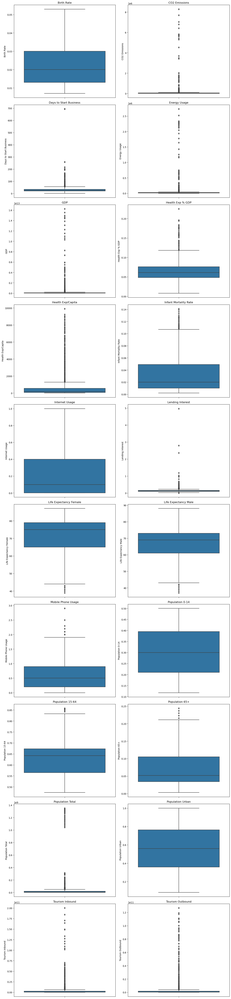

In [20]:
numeric_cols = df.select_dtypes(include=np.number).columns
plt.figure(figsize=(14, 6 * ((len(numeric_cols) + 1)//2)))  # adjust height dynamically

# Plot boxplots for each numeric feature
for i, col in enumerate(numeric_cols, 1):
    plt.subplot((len(numeric_cols) + 1)//2, 2, i)  # 2 plots per row
    sns.boxplot(y=df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

##### IQR is calculated for each numeric feature, for detecting rows where any value is outside 1.5 × IQR, and counts how many such outlier rows exist.

In [21]:
Q1 = df[numeric_cols].quantile(0.25)
Q3 = df[numeric_cols].quantile(0.75)
IQR = Q3 - Q1

# Rows with any feature outside 1.5*IQR
outliers = ((df[numeric_cols] < (Q1 - 1.5 * IQR)) | (df[numeric_cols] > (Q3 + 1.5 * IQR))).any(axis=1)
print("Number of outlier rows:", outliers.sum())

Number of outlier rows: 1347


* Using Winsorization technique to handle outliers without deleting any records. 
* Instead of removing extreme values, it caps them at the 5th and 95th percentile limits.
* This means any values below the 5th percentile are set to that threshold, and values above the 95th percentile are pulled down accordingly. 
* By doing this, the dataset keeps all original rows while preventing extreme observations from skewing averages, variances, and model performance. 
* Compared to outright removal, winsorizing preserves data size and avoids introducing bias.

In [22]:
from scipy.stats.mstats import winsorize

numeric_cols = df.select_dtypes(include=np.number).columns

# Cap values at 5th and 95th percentile
df[numeric_cols] = df[numeric_cols].apply(lambda x: winsorize(x, limits=[0.05, 0.05]))

##### Feature extraction

* Population breakdown (0–14, 15–64, 65+, Total, Urban)
    * These are highly correlated (since they add up to Population Total).
    * Keeping Population Total or % Urban (more meaningful) and dropping the other three

In [23]:
df.drop(['Population 0-14','Population 15-64','Population 65+'],axis=1,inplace=True)

##### Life Expectancy Female & Male → Very correlated. Combining into one (e.g., average life expectancy).

In [24]:
df["Avg Life Expectancy"] = (df["Life Expectancy Male"] + df["Life Expectancy Female"]) / 2
df.drop(columns=["Life Expectancy Male", "Life Expectancy Female"], inplace=True)

In [25]:
print(df.shape)
df.head()

(2704, 17)


,Birth Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,Lending Interest,Mobile Phone Usage,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,Avg Life Expectancy
0,0.020,87931.0,Algeria,26.0,26998.0,5.479006e+10,0.035,60.0,0.034,0.0,0.100,0.0,31719449,0.599,102000000.0,193000000.0,69.0
1,0.044,9542.0,Angola,26.0,7499.0,9.129595e+09,0.034,22.0,0.092,0.0,0.268,0.0,13924930,0.324,34000000.0,146000000.0,49.0
2,0.043,1617.0,Benin,26.0,1983.0,2.359122e+09,0.043,15.0,0.090,0.0,0.120,0.0,6949366,0.383,77000000.0,50000000.0,55.0
3,0.027,4276.0,Botswana,26.0,1836.0,5.788312e+09,0.047,152.0,0.054,0.0,0.155,0.1,1755375,0.532,227000000.0,209000000.0,50.5
4,0.044,1041.0,Burkina Faso,26.0,14338.0,2.610959e+09,0.051,15.0,0.092,0.0,0.120,0.0,11607944,0.178,23000000.0,30000000.0,50.5


#### Standardisation:

* Country -- Just an identifier, doesn’t help clustering

In [26]:
countries=df['Country'] #so storing it in countries variable

In [27]:
from sklearn.preprocessing import StandardScaler

X=df.drop(columns=["Country"])   # drop categorical feature

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [28]:
# Convert back to DataFrame
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

In [29]:
X_scaled

,Birth Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,Lending Interest,Mobile Phone Usage,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,Avg Life Expectancy
0,-0.228817,0.303171,-0.246495,-0.100467,-0.269018,-1.349167,-0.545931,0.115138,-0.919310,-0.543171,-1.295062,0.466265,0.153519,-0.559548,-0.474419,-0.004002
1,2.001476,-0.412621,-0.246495,-0.486907,-0.439423,-1.397477,-0.581305,2.268925,-0.919310,2.575281,-1.295062,-0.148725,-1.002801,-0.572785,-0.483622,-2.147047
2,1.908547,-0.484987,-0.246495,-0.596225,-0.464690,-0.962685,-0.587821,2.194656,-0.919310,-0.171927,-1.295062,-0.389805,-0.754718,-0.564415,-0.502419,-1.504134
3,0.421685,-0.460707,-0.246495,-0.599139,-0.451893,-0.769444,-0.460289,0.857823,-0.919310,0.477751,-1.064859,-0.569313,-0.128203,-0.535216,-0.471286,-1.986319
4,2.001476,-0.490246,-0.246495,-0.351368,-0.463751,-0.576203,-0.587821,2.268925,-0.919310,-0.171927,-1.295062,-0.228802,-1.616702,-0.574927,-0.506335,-1.986319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-0.228817,-0.421871,-0.246495,-0.351368,-0.417217,-0.093101,-0.422122,-0.404741,-0.517400,-0.171927,-0.144047,-0.628032,1.465416,-0.445380,-0.422923,0.317454
2700,-0.879319,-0.421871,-1.147458,3.323846,3.590339,2.080859,3.105029,-0.924621,2.295972,-1.415596,1.006967,3.293684,1.044936,3.169947,3.332551,1.013944
2701,-0.693461,-0.421871,-1.147458,-0.351368,-0.286879,1.259586,0.615823,-0.776084,1.090241,-0.320425,1.927779,-0.512638,1.616789,-0.146869,-0.310925,0.853216
2702,-0.228817,-0.421871,2.978003,-0.351368,0.949464,-0.817754,-0.049765,-0.664681,1.090241,0.644811,1.006967,0.405277,1.372910,-0.403431,0.114748,0.638911


In [30]:
X_scaled.columns

Index(['Birth Rate', 'CO2 Emissions', 'Days to Start Business', 'Energy Usage',
       'GDP', 'Health Exp % GDP', 'Health Exp/Capita', 'Infant Mortality Rate',
       'Internet Usage', 'Lending Interest', 'Mobile Phone Usage',
       'Population Total', 'Population Urban', 'Tourism Inbound',
       'Tourism Outbound', 'Avg Life Expectancy'],
      dtype='object')

In [31]:
print("Summary Statistics:\n", X_scaled.describe())

Summary Statistics:
          Birth Rate  CO2 Emissions  Days to Start Business  Energy Usage  \
count  2.704000e+03   2.704000e+03            2.704000e+03  2.704000e+03   
mean  -8.786528e-16  -5.985104e-16           -3.526108e-16  2.984956e-17   
std    1.000185e+00   1.000185e+00            1.000185e+00  1.000185e+00   
min   -1.251034e+00  -4.981084e-01           -1.147458e+00 -6.190761e-01   
25%   -8.793187e-01  -4.793254e-01           -5.310097e-01 -4.799158e-01   
50%   -2.288167e-01  -4.218714e-01           -2.464951e-01 -3.513683e-01   
75%    7.004719e-01  -1.111065e-01            1.447124e-01 -1.702573e-01   
max    2.001476e+00   3.265869e+00            2.978003e+00  3.323846e+00   

                GDP  Health Exp % GDP  Health Exp/Capita  \
count  2.704000e+03      2.704000e+03       2.704000e+03   
mean  -2.121495e-16     -4.177963e-16       9.388447e-16   
std    1.000185e+00      1.000185e+00       1.000185e+00   
min   -4.715682e-01     -1.590718e+00      -5.878211e-

#### Bivariate Analysis

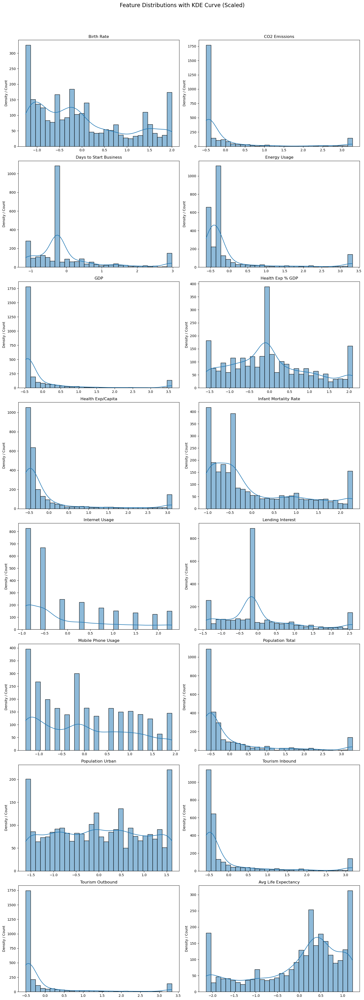

In [32]:
numeric_cols = X_scaled.columns
n_rows = (len(numeric_cols)+1) // 2

plt.figure(figsize=(15, 5 * n_rows))
plt.suptitle("Feature Distributions with KDE Curve (Scaled)", fontsize=16, y=1.02)

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows,2, i)
    sns.histplot(X_scaled[col], kde=True, bins=30)
    plt.title(col)
    plt.xlabel("")
    plt.ylabel("Density / Count")

plt.tight_layout()
plt.show()

#### Correlation Heatmap
* This heatmap shows how strongly features are correlated with one another. It helps detect multicollinearity and spot redundant variables that may affect modeling.

In [33]:
X_scaled.corr()

,Birth Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Infant Mortality Rate,Internet Usage,Lending Interest,Mobile Phone Usage,Population Total,Population Urban,Tourism Inbound,Tourism Outbound,Avg Life Expectancy
Birth Rate,1.000000,-0.294350,0.254993,-0.274600,-0.342936,-0.256084,-0.470577,0.872211,-0.636028,0.409232,-0.554213,-0.026628,-0.596061,-0.436484,-0.391570,-0.859733
CO2 Emissions,-0.294350,1.000000,-0.042350,0.892347,0.752431,0.109030,0.283254,-0.242568,0.178041,-0.188998,0.114989,0.657731,0.240437,0.622185,0.670141,0.237713
Days to Start Business,0.254993,-0.042350,1.000000,-0.074531,-0.118690,-0.179134,-0.257684,0.261835,-0.320247,0.231812,-0.262866,0.030834,-0.194538,-0.214044,-0.183586,-0.290188
Energy Usage,-0.274600,0.892347,-0.074531,1.000000,0.877154,0.158896,0.348972,-0.216923,0.252773,-0.196858,0.152963,0.751854,0.228321,0.691734,0.778708,0.228328
GDP,-0.342936,0.752431,-0.118690,0.877154,1.000000,0.291890,0.542053,-0.309887,0.423561,-0.268935,0.298436,0.647537,0.311854,0.839093,0.916103,0.342311
Health Exp % GDP,-0.256084,0.109030,-0.179134,0.158896,0.291890,1.000000,0.490488,-0.226282,0.357836,-0.035614,0.223596,-0.045908,0.214014,0.332581,0.327000,0.245784
Health Exp/Capita,-0.470577,0.283254,-0.257684,0.348972,0.542053,0.490488,1.000000,-0.494906,0.731853,-0.355102,0.482442,0.067312,0.492737,0.589356,0.640984,0.511832
Infant Mortality Rate,0.872211,-0.242568,0.261835,-0.216923,-0.309887,-0.226282,-0.494906,1.000000,-0.632127,0.422883,-0.593482,0.041340,-0.616233,-0.391516,-0.359202,-0.925808
Internet Usage,-0.636028,0.178041,-0.320247,0.252773,0.423561,0.357836,0.731853,-0.632127,1.000000,-0.437042,0.760553,-0.013897,0.536452,0.510872,0.526471,0.657713
Lending Interest,0.409232,-0.188998,0.231812,-0.196858,-0.268935,-0.035614,-0.355102,0.422883,-0.437042,1.000000,-0.406699,-0.038259,-0.292676,-0.369078,-0.332473,-0.435912


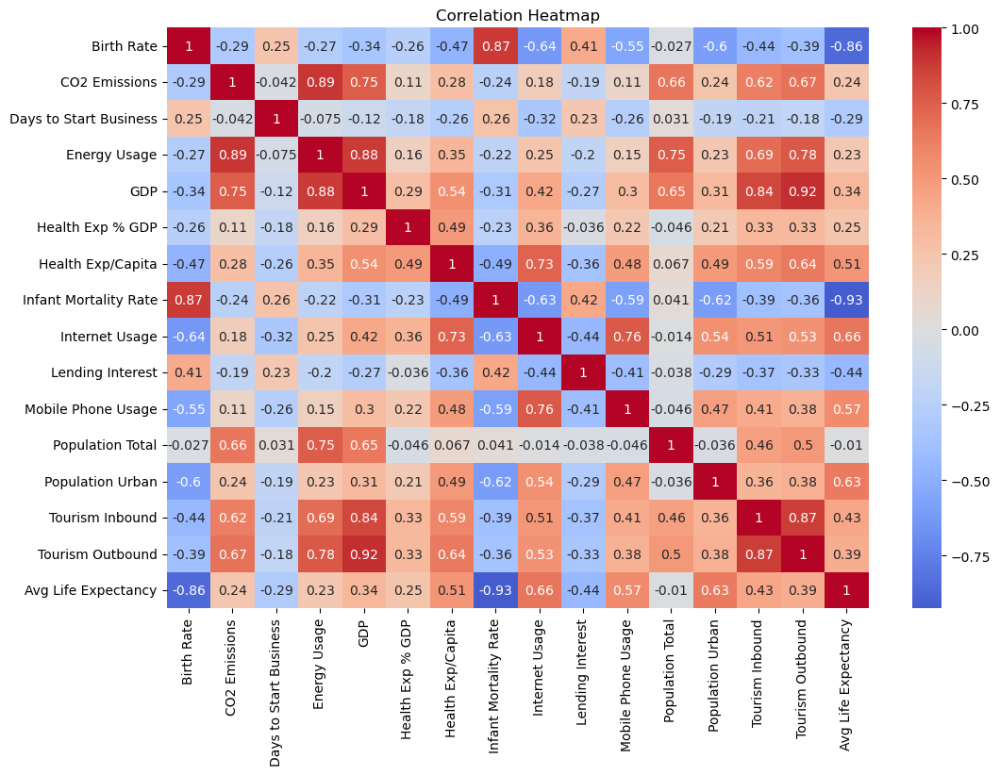

In [34]:
#Correlation heatmap
plt.figure(figsize=(12,8))
sns.heatmap(X_scaled.corr(), annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap")
plt.show()

#### Key correlations:
* **Avg Life Expectancy** has an extremely strong inverse relationship with **Infant Mortality Rate** (-0.93$) and **Birth Rate** (-0.86$).
* **Infant Mortality Rate** is strongly inversely related to **Birth Rate** (-0.87$), indicating that lower fertility rates accompany better child survival.
* **GDP** shows a strong positive correlation with **Energy Usage** (0.88$), reflecting economic activity's high energy demand.
* **GDP** is strongly linked to healthcare spending, correlating positively with **Health Exp/Capita** (0.73$).
* **GDP** is strongly linked to demographics, correlating negatively with **Birth Rate** (-0.74$).
* **CO2 Emissions** are highly positively correlated with **Energy Usage** (0.89$), highlighting the environmental impact of current energy sources.
* **Mobile Phone Usage** is strongly inversely correlated with **Infant Mortality Rate** (-0.76$), suggesting that greater connectivity is a proxy for development that improves health outcomes.

#### Multivariate Analysis

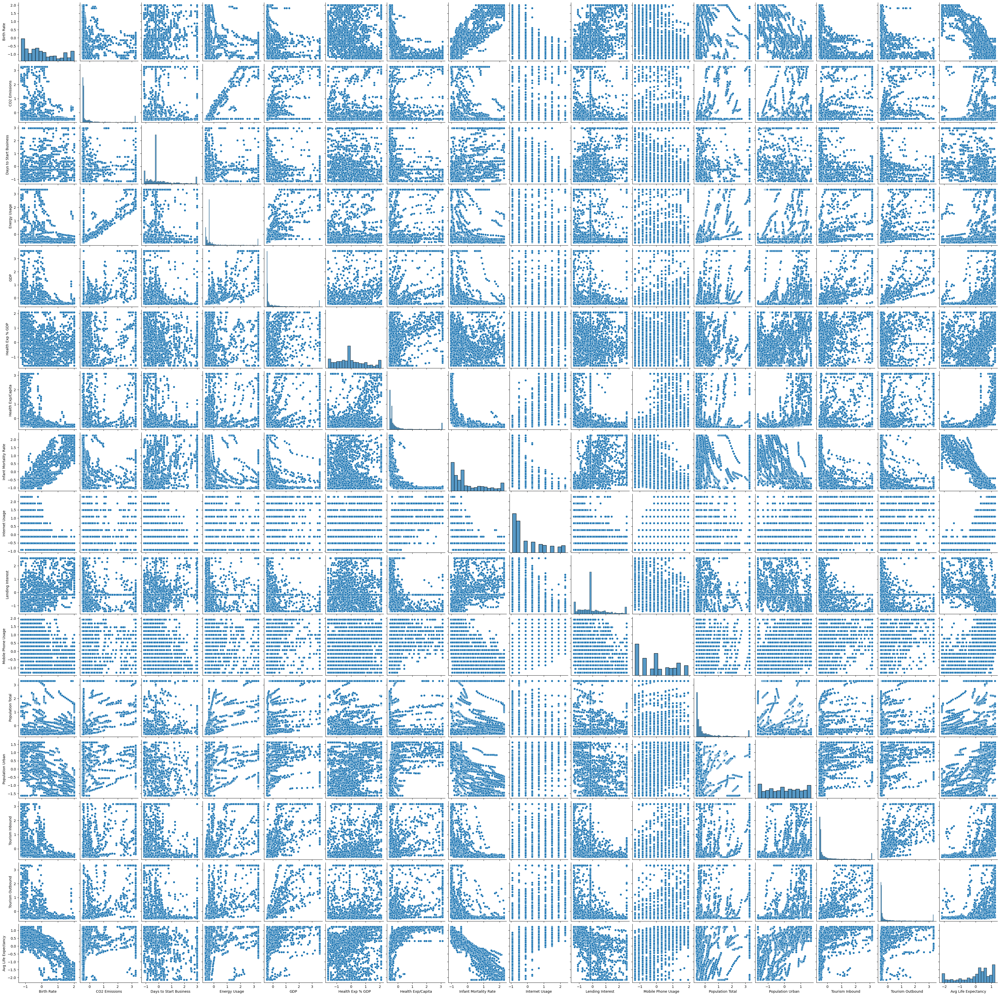

In [35]:
#Pairwise scatterplots
sns.pairplot(X_scaled)
plt.show()

#### Summary based on pair plot

- Strong Positive Relationships
    * GDP & Health Expenditure/Capita – Higher GDP countries spend more on health.
    * GDP & Internet/Mobile Usage – Better digital access in wealthier nations.
    * Tourism Inbound & Outbound – Developed countries both send and receive more tourists.
    * Avg Life Expectancy & Health Spending – More health investment links to longer lives.

- Negative Relationships
    * GDP & Infant Mortality – Lower GDP, higher child mortality.
    * Birth Rate & Avg Life Expectancy – Higher births, lower life expectancy.
    * CO₂ Emissions & Birth Rate – Industrial nations tend to have fewer births.

- Weak or No Clear Relations
    * Tourism vs Birth Rate
    * Energy Use vs Life Expectancy
    * Days to Start Business vs Health Spend
    * Lending Interest vs CO₂
    * Mobile Usage vs Urban Population

- Possible Multicollinearity: Some features mirror each other:
    * Mobile vs Internet Usage
    * Health Exp/Capita vs %GDP
    * Tourism Inbound vs GDP (in richer regions)

In [36]:
#Correlation insights
corr_matrix=X_scaled.corr()
high_corr=corr_matrix.abs().unstack().sort_values(ascending=False)
high_corr=high_corr[high_corr < 1]
print("Highly correlated feature pairs:\n \n", high_corr.head(10))

Highly correlated feature pairs:
 
 Avg Life Expectancy    Infant Mortality Rate    0.925808
Infant Mortality Rate  Avg Life Expectancy      0.925808
Tourism Outbound       GDP                      0.916103
GDP                    Tourism Outbound         0.916103
Energy Usage           CO2 Emissions            0.892347
CO2 Emissions          Energy Usage             0.892347
Energy Usage           GDP                      0.877154
GDP                    Energy Usage             0.877154
Infant Mortality Rate  Birth Rate               0.872211
Birth Rate             Infant Mortality Rate    0.872211
dtype: float64


In [37]:
# Get top 5 GDP indices
top_idx=X_scaled["GDP"].sort_values(ascending=False).head().index

# Fetch corresponding countries and scaled GDP
top_gdp=pd.DataFrame({
    "Country": df.loc[top_idx, "Country"].values,
    "GDP (standardized)":X_scaled.loc[top_idx,"GDP"].values
}, index=top_idx)

print("Top 5 countries with highest GDP (standardized):")
print(top_gdp)

Top 5 countries with highest GDP (standardized):
            Country  GDP (standardized)
481           Japan            3.590339
1452  United States            3.590339
2148    Korea, Rep.            3.590339
1627         Brazil            3.590339
2478         Mexico            3.590339


In [38]:
#Get top 5 indices for Avg Life Expectancy
top_idx = X_scaled["Avg Life Expectancy"].sort_values(ascending=False).head().index

#Fetch corresponding countries and standardized Avg Life Expectancy
top_life=pd.DataFrame({
    "Country": df.loc[top_idx,"Country"].values,
    "Avg Life Expectancy (standardized)": X_scaled.loc[top_idx,"Avg Life Expectancy"].values
},index=top_idx)

print("Top 5 countries with highest Avg Life Expectancy (standardized):")
print(top_life)

Top 5 countries with highest Avg Life Expectancy (standardized):
                   Country  Avg Life Expectancy (standardized)
2210                Sweden                            1.228248
1585                 Spain                            1.228248
1420                Canada                            1.228248
1951             Singapore                            1.228248
1518  Hong Kong SAR, China                            1.228248


## MODEL DEVELOPMENT

### Elbow Method and Silhouette Score

C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\joblib\externals\loky\backend\context.py:131: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\joblib\externals\loky\backend\context.py", line 247, in _count_physical_cores
    cpu_count_physical = _count_physical_cores_win32()
  File "C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\joblib\externals\loky\backend\context.py", line 299, in _count_physical_cores_win32
    cpu_info = subprocess.run(
  File "C:\ProgramData\Anaconda3\lib\subprocess.py", line 505, in run
    with Popen(*popenargs, **kwargs) as process:
  File "C:\ProgramData\Anaconda3\lib\subprocess.py", line 951, in __init__
    self._ex

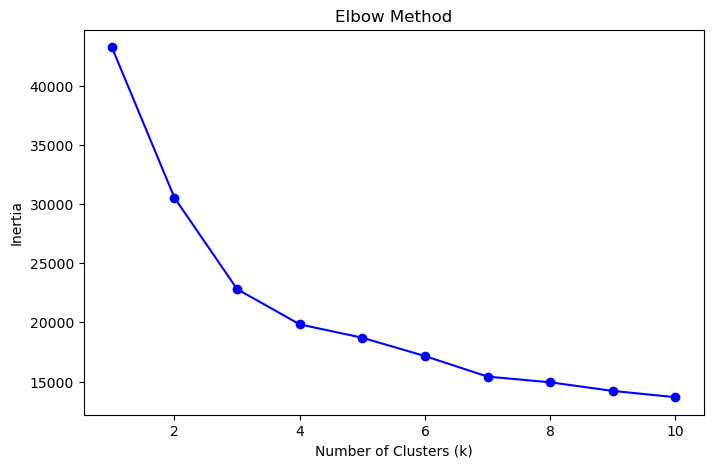

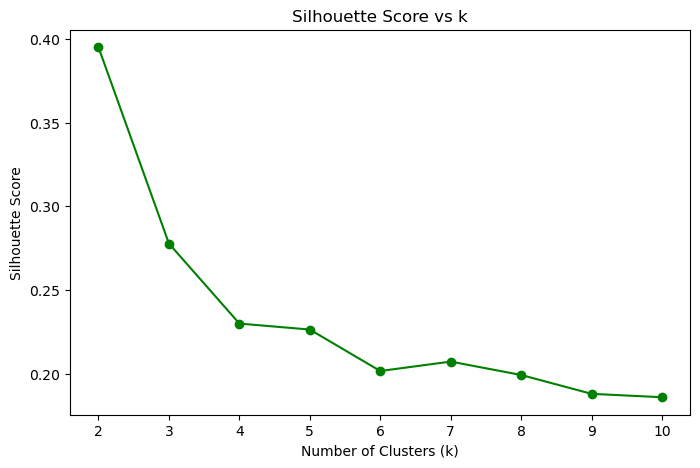

In [39]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Scale numeric data
X = df[numeric_cols]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Elbow Method 
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(
        n_clusters=k,
        init="k-means++",
        n_init="auto",   # works fine in new sklearn
        max_iter=300,
        random_state=42
    )
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K, inertia, "bo-")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method")
plt.show()

#Silhouette Score
sil_scores = []
K = range(2, 11)  # silhouette requires >=2 clusters

for k in K:
    kmeans = KMeans(
        n_clusters=k,
        init="k-means++",
        n_init="auto",
        max_iter=300,
        random_state=42
    )
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    sil_scores.append(score)



plt.figure(figsize=(8,5))
plt.plot(range(2,11), sil_scores, "go-")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs k")
plt.show()


#### Elbow plot: suggested a bend around k = 3–4.

#### Silhouette plot: clearly favors k = 2.

## Train Models

In [40]:
results = {}
models_labels = {}

from sklearn.decomposition import PCA
def plot_clusters(X, labels, title):
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    plt.figure(figsize=(8,6))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, cmap='tab10', s=30)
    plt.title(title)
    plt.xlabel("PC 1")
    plt.ylabel("PC 2")
    plt.show()

### 1.  K-Mean cluster

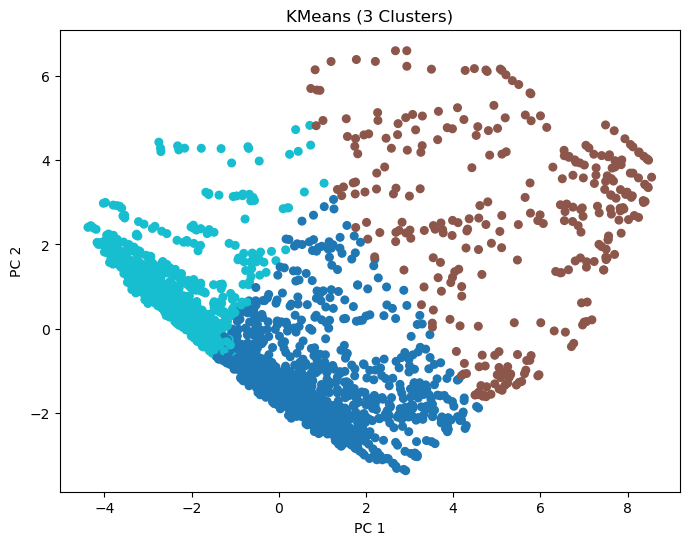

In [41]:
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)
results["KMeans"] = silhouette_score(X_scaled, kmeans_labels)
models_labels["KMeans"] = kmeans_labels
plot_clusters(X_scaled, kmeans_labels, "KMeans (3 Clusters)")

#### SUMMARY:
##### 1.The three clusters represent groups of countries with similar socio-economic and demographic patterns.

##### 2.This suggests that KMeans effectively partitions the dataset into three broad segments, though some overlap exists.

### 2.Agglomerative Clustering

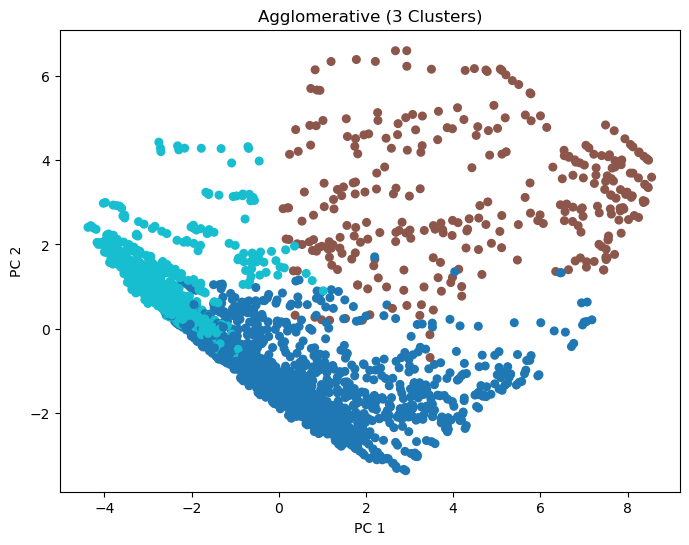

In [42]:
agg = AgglomerativeClustering(n_clusters=n_clusters)
agg_labels = agg.fit_predict(X_scaled)
results["Agglomerative"] = silhouette_score(X_scaled, agg_labels)
models_labels["Agglomerative"] = agg_labels
plot_clusters(X_scaled, agg_labels, "Agglomerative (3 Clusters)")



##### Agglomerative clustering partitions the dataset into three meaningful groups, similar to KMeans, but based on hierarchical similarity rather than centroids.

### 3. KMedoids clustering

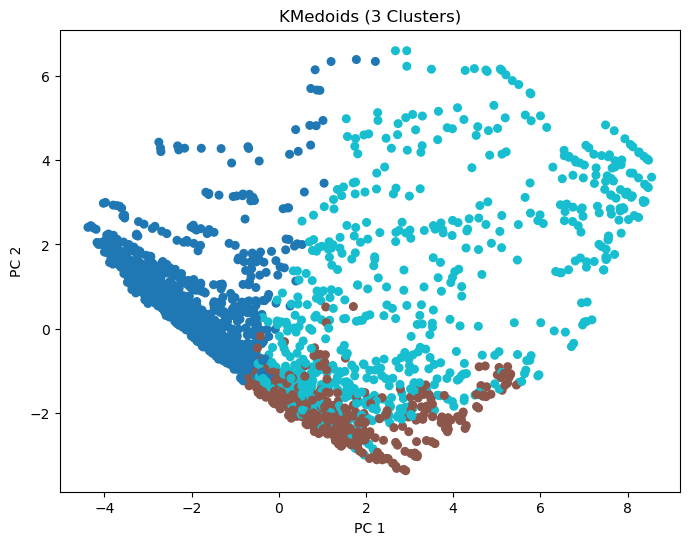

In [43]:
kmed = KMedoids(n_clusters=n_clusters, random_state=42)
kmed_labels = kmed.fit_predict(X_scaled)
results["KMedoids"] = silhouette_score(X_scaled, kmed_labels)
models_labels["KMedoids"] = kmed_labels
plot_clusters(X_scaled, kmed_labels, "KMedoids (3 Clusters)")


#### Summary : one large majority group, one distinct low-feature group, and one smaller, tighter mid-level group.

### 4.Gaussian Mixture Model (GMM)

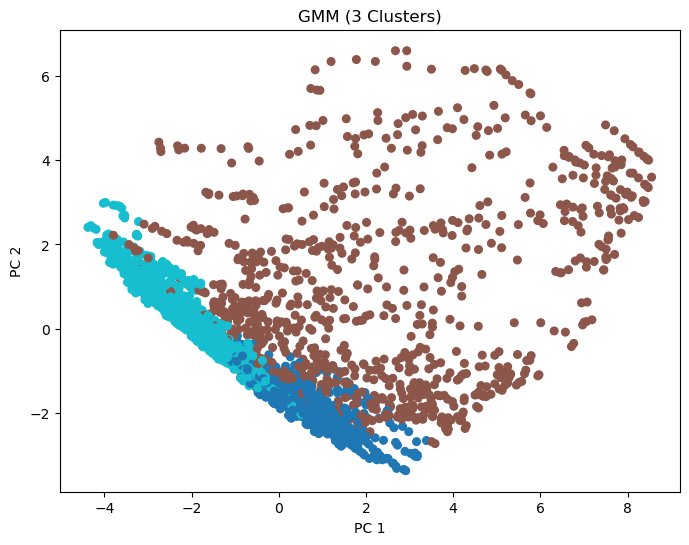

In [44]:
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
gmm_labels = gmm.fit_predict(X_scaled)
results["GMM"] = silhouette_score(X_scaled, gmm_labels)
models_labels["GMM"] = gmm_labels
plot_clusters(X_scaled, gmm_labels, "GMM (3 Clusters)")

#### The brown cluster is dominant, covering most of the dataset, which indicates GMM identified a very broad distribution that overlaps much of the space.

### 5. DBSCAN Clustering


 Best DBSCAN Parameters (~25 clusters):
eps = 0.4, min_samples = 5
Clusters (excluding noise): 28
Noise: 91.09%
Silhouette Score (excluding noise): 0.758


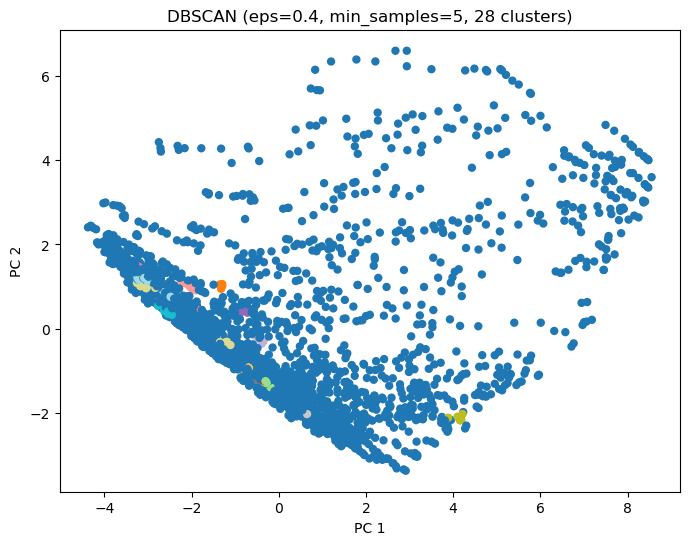

In [90]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

best_labels = None
best_sil = -1
best_eps, best_min_samples = None, None
best_n_clusters = None

target_clusters = 25  # desired number of clusters

# moderate eps range → helps create more clusters with less noise
for eps_try in np.arange(0.3, 2.0, 0.1):  
    for min_samples_try in [2, 3, 4, 5, 6]:
        db = DBSCAN(eps=eps_try, min_samples=min_samples_try)
        labels = db.fit_predict(X_scaled)

        mask = labels != -1
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        noise_ratio = np.sum(labels == -1) / len(labels)

        # Keep only models that form ~25 clusters
        if n_clusters < 23 or n_clusters > 30:
            continue

        # Calculate silhouette excluding noise
        if n_clusters >= 2 and len(set(labels[mask])) > 1:
            sil = silhouette_score(X_scaled[mask], labels[mask])
            if sil > best_sil:
                best_sil = sil
                best_labels = labels
                best_eps = eps_try
                best_min_samples = min_samples_try
                best_n_clusters = n_clusters
                best_noise = noise_ratio

if best_labels is not None:
    print(f"\n Best DBSCAN Parameters (~{target_clusters} clusters):")
    print(f"eps = {best_eps}, min_samples = {best_min_samples}")
    print(f"Clusters (excluding noise): {best_n_clusters}")
    print(f"Noise: {best_noise*100:.2f}%")
    print(f"Silhouette Score (excluding noise): {best_sil:.3f}")
else:
    print(" Could not find suitable DBSCAN with ~25 clusters.")


#PCA Visualization

if best_labels is not None:
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    plt.figure(figsize=(8,6))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=best_labels, cmap='tab20', s=25)
    plt.title(f"DBSCAN (eps={best_eps}, min_samples={best_min_samples}, {best_n_clusters} clusters)")
    plt.xlabel("PC 1")
    plt.ylabel("PC 2")
    plt.show()
    

##### Unlike KMeans, Agglomerative, or GMM, DBSCAN does not require you to predefine the number of clusters — instead, it detects dense regions of data automatically.
##### The plot shows many small clusters scattered across the dataset, which is typical for DBSCAN when the data has varying densities.
##### DBSCAN created 28 clusters, with one very large group and many smaller ones — highlighting both the core population and niche groups of countries that standard clustering methods may miss.

In [76]:
import numpy as np

# overwrite dataframe & models dictionary
df["DBSCAN_Cluster"] = np.asarray(best_labels)

if "models_labels" not in globals():
    models_labels = {}
models_labels["DBSCAN"] = np.asarray(best_labels)

print("Tuned DBSCAN labels (best_labels) applied to df['DBSCAN_Cluster'] and models_labels['DBSCAN'].")

Tuned DBSCAN labels (best_labels) applied to df['DBSCAN_Cluster'] and models_labels['DBSCAN'].


### Silhouette Score Comparison

KMeans: Silhouette (excl. noise) = 0.278
Agglomerative: Silhouette (excl. noise) = 0.261
KMedoids: Silhouette (excl. noise) = 0.164
GMM: Silhouette (excl. noise) = 0.121
DBSCAN: Silhouette (excl. noise) = 0.758

=== Silhouette Score Comparison (Excluding Noise for DBSCAN) ===
        Model  Silhouette Score
       DBSCAN          0.757820
       KMeans          0.277737
Agglomerative          0.260602
     KMedoids          0.163891
          GMM          0.120695


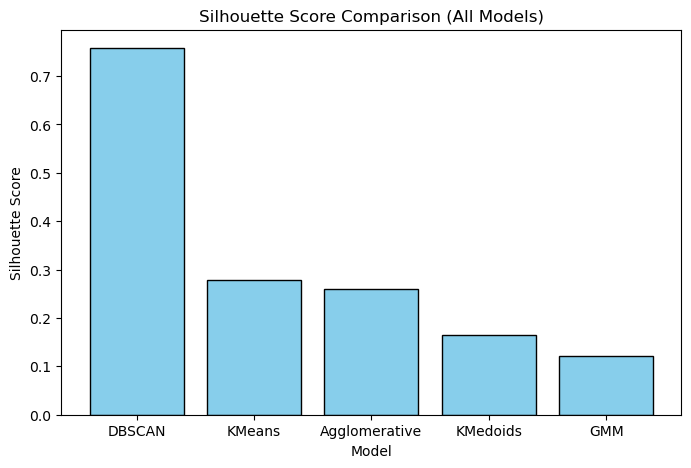

In [87]:
from sklearn.metrics import silhouette_score

model_names = ["KMeans", "Agglomerative", "KMedoids", "GMM", "DBSCAN"]

def fetch_labels(name):
    try:
        if "models_labels" in globals() and name in models_labels:
            return np.asarray(models_labels[name])
    except Exception:
        pass
    # fallback
    name_map = {
        "KMeans": "kmeans_labels",
        "Agglomerative": "agg_labels",
        "KMedoids": "kmed_labels",
        "GMM": "gmm_labels",
        "DBSCAN": "best_labels"
    }
    var = name_map.get(name)
    if var and var in globals():
        return np.asarray(globals()[var])
    return None

results = {}

for model in model_names:
    labels = fetch_labels(model)
    if labels is None:
        print(f" Skipped {model}: labels not found.")
        continue

    labels = np.asarray(labels)
    mask = labels != -1  # exclude noise for DBSCAN

    # compute silhouette safely
    if mask.sum() > 0 and len(set(labels[mask])) > 1:
        sil = silhouette_score(X_scaled[mask], labels[mask])
    else:
        sil = np.nan

    results[model] = sil
    print(f"{model}: Silhouette (excl. noise) = {sil:.3f}")

# convert to DataFrame and plot
results_df = pd.DataFrame(list(results.items()), columns=["Model", "Silhouette Score"])
results_df = results_df.sort_values(by="Silhouette Score", ascending=False)

print("\n=== Silhouette Score Comparison (Excluding Noise for DBSCAN) ===")
print(results_df.to_string(index=False))

plt.figure(figsize=(8,5))
plt.bar(results_df["Model"], results_df["Silhouette Score"], color="skyblue", edgecolor="black")
plt.title("Silhouette Score Comparison (All Models)")
plt.ylabel("Silhouette Score")
plt.xlabel("Model")
plt.show()


#### Conclusion:

#### 1.DBSCAN is the best model for your dataset — it produces compact, well-separated clusters with a very high silhouette score.

#### 2.The other models (KMeans, Agglomerative) are acceptable but not as strong.

#### 3.KMedoids and GMM do not fit the dataset well.

### Cluster Profiles + Heatmaps

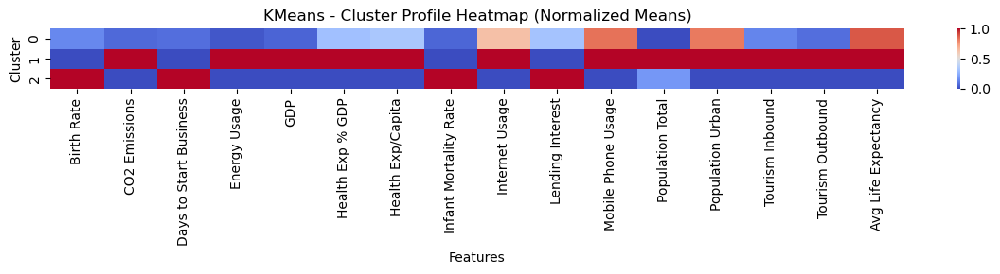

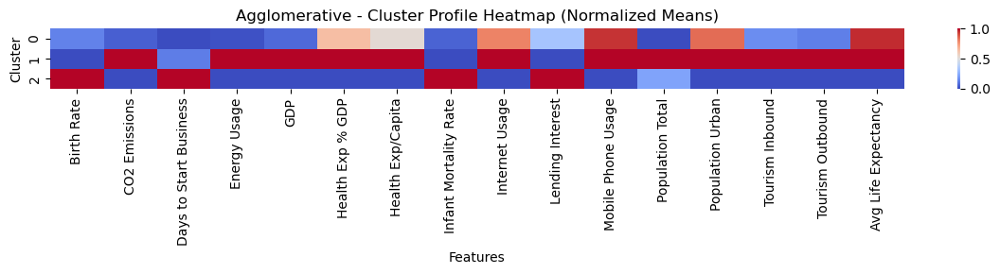

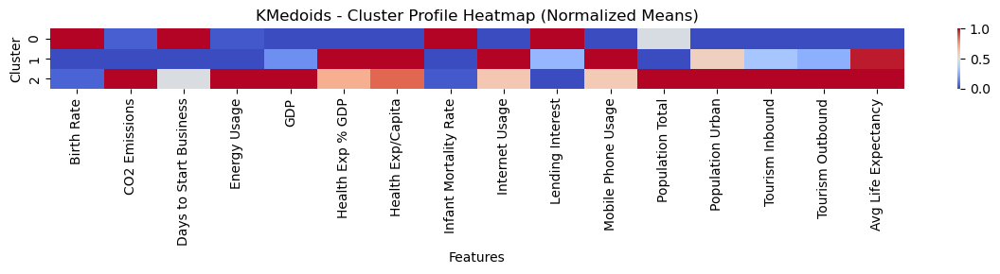

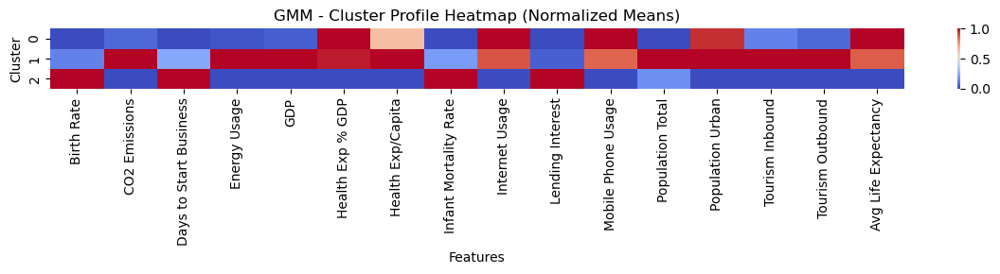

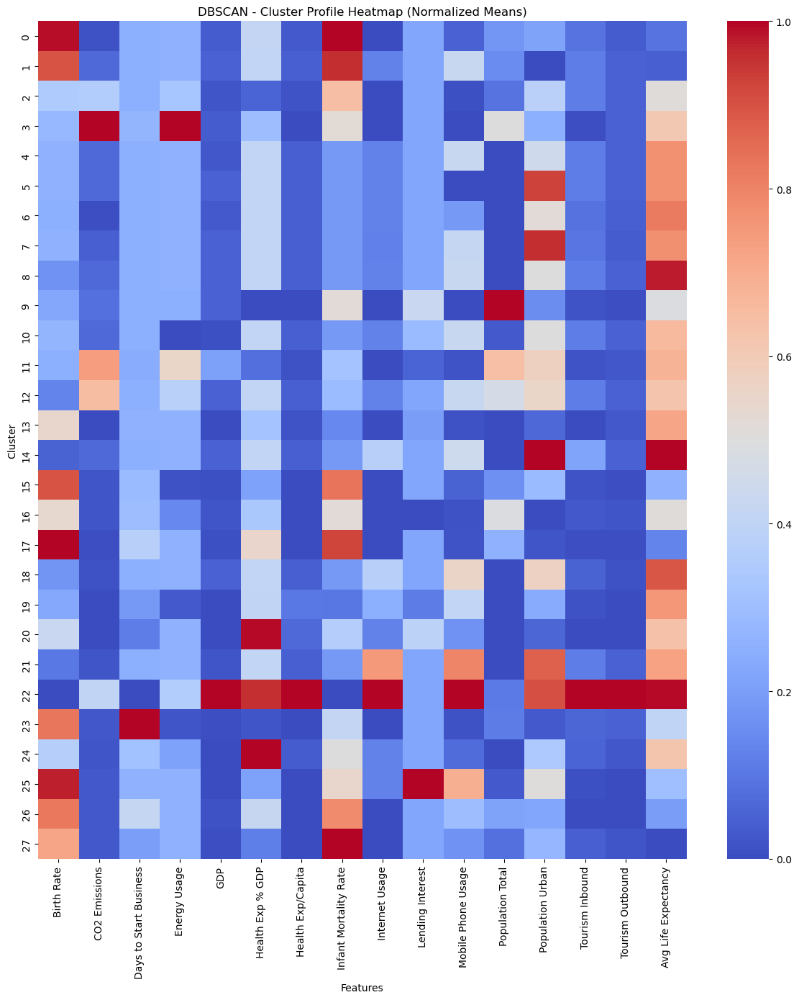

In [78]:
# choose numeric features only (exclude existing cluster columns)
existing_cluster_cols = [c for c in df.columns if "Cluster" in str(c)]
feature_cols = [c for c in df.select_dtypes(include=[np.number]).columns if c not in existing_cluster_cols]
if not feature_cols:
    feature_cols = [c for c in df.columns if c not in existing_cluster_cols]

cluster_profiles_all = {}

for model, labels in results.items():
    lbl = fetch_labels(model)
    if lbl is None:
        continue

    lbl = np.asarray(lbl)
    if model == "DBSCAN":
        mask = lbl != -1
        df_model = df.loc[mask, feature_cols].copy()
        df_model["Cluster"] = lbl[mask]
    else:
        df_model = df[feature_cols].copy()
        df_model["Cluster"] = lbl

    profiles = df_model.groupby("Cluster")[feature_cols].mean()
    cluster_profiles_all[model] = profiles

    # normalize 0–1 for heatmap
    norm = profiles.copy()
    for col in norm.columns:
        mn, mx = norm[col].min(), norm[col].max()
        norm[col] = 0 if mx - mn == 0 else (norm[col] - mn) / (mx - mn)

    plt.figure(figsize=(12, max(3, profiles.shape[0] * 0.5)))
    sns.heatmap(norm, cmap="coolwarm", cbar=True)
    plt.title(f"{model} - Cluster Profile Heatmap (Normalized Means)")
    plt.xlabel("Features")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()


#### SUMMARY :
    
#### DBSCAN discovered 28 meaningful groups of countries.

#### Some clusters are wealthy nations (high GDP, high tourism, industrialization).

#### Others are emerging economies (moderate GDP, high connectivity, rising tourism).

#### Some are developing countries (high birth rate, high infant mortality, low GDP).

### Cluster Summary Tables

In [88]:
from collections import Counter

for model, profiles in cluster_profiles_all.items():
    lbl = fetch_labels(model)
    if lbl is None:
        continue

    print("\n" + "="*72)
    print(f"MODEL: {model}")

    counts = Counter(lbl)
    rows = []

    for cluster in profiles.index:
        size = int(counts.get(cluster, 0))
        top3 = profiles.loc[cluster].sort_values(ascending=False).head(3).index.tolist()
        rows.append({"Cluster": cluster, "Size": size, "Top Features": ", ".join(top3)})

    # handle noise for DBSCAN
    if model == "DBSCAN":
        noise_count = int((lbl == -1).sum())
        rows.append({"Cluster": "Noise", "Size": noise_count, "Top Features": "N/A"})

    summary_df = pd.DataFrame(rows).set_index("Cluster").sort_values(by="Size", ascending=False)
    print(summary_df.to_string())

    # save for slides
    summary_df.to_csv(f"{model}_cluster_summary.csv")
    print(f" Saved -> {model}_cluster_summary.csv")



MODEL: KMeans
         Size                            Top Features
Cluster                                              
0        1398  GDP, Tourism Inbound, Tourism Outbound
2         998  GDP, Tourism Inbound, Tourism Outbound
1         308  GDP, Tourism Outbound, Tourism Inbound
 Saved -> KMeans_cluster_summary.csv

MODEL: Agglomerative
         Size                            Top Features
Cluster                                              
0        1664  GDP, Tourism Inbound, Tourism Outbound
2         737  GDP, Tourism Inbound, Tourism Outbound
1         303  GDP, Tourism Inbound, Tourism Outbound
 Saved -> Agglomerative_cluster_summary.csv

MODEL: KMedoids
         Size                            Top Features
Cluster                                              
0        1375  GDP, Tourism Inbound, Tourism Outbound
2         852  GDP, Tourism Inbound, Tourism Outbound
1         477  GDP, Tourism Inbound, Tourism Outbound
 Saved -> KMedoids_cluster_summary.csv

MODEL: GMM
    

## Analyze the DBSCAN clusters

### 1. DBSCAN Cluster Overview and Point Counts

In [89]:
# Ensure best_labels exist
if "best_labels" not in globals():
    raise ValueError(" 'best_labels' not found. Run your DBSCAN tuning code first.")

# Use best_labels from your tuned DBSCAN
dbscan_labels = np.asarray(best_labels)
df["DBSCAN_Cluster"] = dbscan_labels  # make sure it's in your DataFrame

# --- Basic cluster stats ---
unique_labels = np.unique(dbscan_labels)
n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
n_noise = np.sum(dbscan_labels == -1)
noise_pct = n_noise / len(dbscan_labels) * 100

print("=== DBSCAN Model Summary ===")
print(f"Total clusters (excluding noise): {n_clusters}")
print(f"Noise points: {n_noise} ({noise_pct:.2f}%)\n")

# --- Cluster counts ---
print("=== Cluster Size Breakdown ===")
cluster_counts = Counter(dbscan_labels)
for cluster, count in sorted(cluster_counts.items()):
    label = "Noise" if cluster == -1 else f"Cluster {cluster}"
    print(f"{label:10s}: {count:5d}")

# --- Quick profile summary (mean per feature) ---
numeric_cols = [c for c in df.select_dtypes(include=[np.number]).columns if "Cluster" not in c]

cluster_summary = (
    df[df["DBSCAN_Cluster"] != -1]
    .groupby("DBSCAN_Cluster")[numeric_cols]
    .mean()
    .round(2)
)

print("\n=== Cluster Feature Means (sample) ===")
print(cluster_summary.head(10))

# --- Optional: save results ---
cluster_summary.to_csv("DBSCAN_cluster_feature_summary.csv")
print("\n Saved -> DBSCAN_cluster_feature_summary.csv")

=== DBSCAN Model Summary ===
Total clusters (excluding noise): 28
Noise points: 2463 (91.09%)

=== Cluster Size Breakdown ===
Noise     :  2463
Cluster 0 :    17
Cluster 1 :     8
Cluster 2 :     8
Cluster 3 :     6
Cluster 4 :    10
Cluster 5 :     5
Cluster 6 :     5
Cluster 7 :    43
Cluster 8 :    13
Cluster 9 :    11
Cluster 10:     9
Cluster 11:     5
Cluster 12:     8
Cluster 13:     7
Cluster 14:     9
Cluster 15:     8
Cluster 16:     7
Cluster 17:     5
Cluster 18:     7
Cluster 19:     5
Cluster 20:     5
Cluster 21:     7
Cluster 22:     5
Cluster 23:     6
Cluster 24:     6
Cluster 25:     5
Cluster 26:     6
Cluster 27:     5

=== Cluster Feature Means (sample) ===
                Birth Rate  CO2 Emissions  Days to Start Business  \
DBSCAN_Cluster                                                      
0                     0.04        1589.94                    26.0   
1                     0.04        8529.00                    26.0   
2                     0.02       431

### 2. PCA-Based 2D Visualization of DBSCAN Clusters

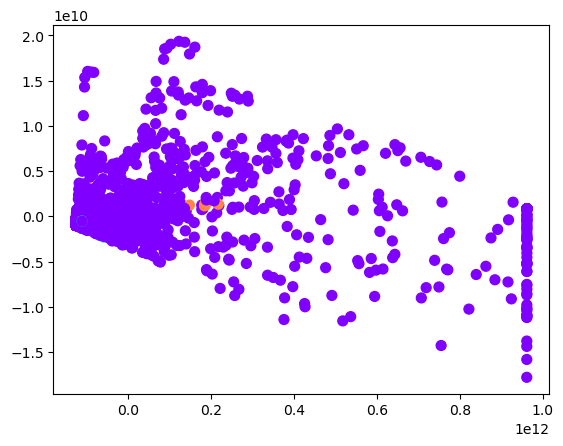

In [81]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
plt.scatter(X_pca[:,0], X_pca[:,1], c=dbscan_labels, cmap='rainbow', s=50)
plt.show()

### 3.Average Feature Values per DBSCAN Cluster

In [83]:
import pandas as pd
df['cluster'] = dbscan_labels
cluster_summary = df.groupby('cluster').mean()
print(cluster_summary)


         Birth Rate  CO2 Emissions  Days to Start Business  Energy Usage  \
cluster                                                                    
-1         0.022206   58697.864799               31.549330  33797.489647   
 0         0.043706    1589.941176               26.000000  14338.000000   
 1         0.040625    8529.000000               26.000000  14338.000000   
 2         0.022875   43197.375000               26.000000  17878.875000   
 3         0.020667  120463.500000               27.500000  50678.333333   
 4         0.020000    8529.000000               26.000000  14338.000000   
 5         0.020000    8529.000000               26.000000  14338.000000   
 6         0.019800    1040.600000               26.000000  14338.000000   
 7         0.020023    5643.046512               26.000000  14338.000000   
 8         0.017077    8529.000000               26.000000  14338.000000   
 9         0.018909   10365.181818               26.000000  14282.000000   
 10        0

### 4.DBSCAN Cluster Visualization 

#### Visualization with Noise Points

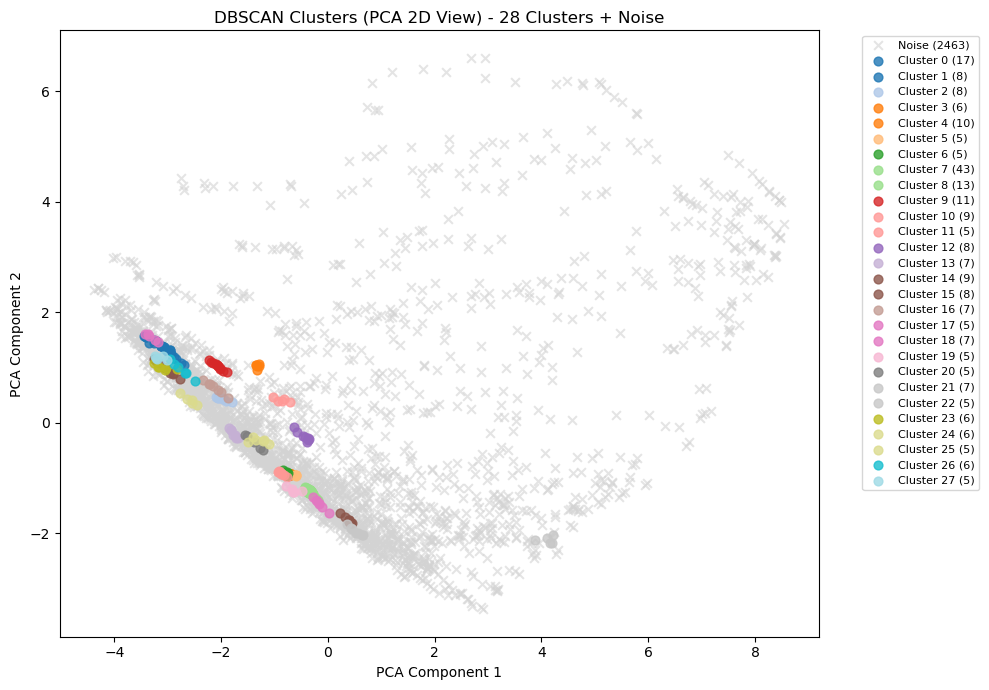

In [86]:
# Convert X to numpy array safely
X_plot = X_scaled if hasattr(X, "shape") else np.asarray(X)

# DBSCAN labels
labels = best_labels  # use tuned DBSCAN labels
unique_labels = np.unique(labels)

# PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_plot)

# Plot clusters
plt.figure(figsize=(10,7))
colors = plt.cm.get_cmap("tab20", len(unique_labels))

for k in unique_labels:
    mask = (labels == k)
    if k == -1:
        plt.scatter(
            X_pca[mask, 0],
            X_pca[mask, 1],
            c="lightgray",
            marker="x",
            s=40,
            alpha=0.6,
            label=f"Noise ({np.sum(mask)})"
        )
    else:
        plt.scatter(
            X_pca[mask, 0],
            X_pca[mask, 1],
            color=[colors(k)],
            s=40,
            alpha=0.8,
            label=f"Cluster {k} ({np.sum(mask)})"
        )

plt.title(f"DBSCAN Clusters (PCA 2D View) - {len(unique_labels)-1} Clusters + Noise")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

#### DBSCAN achieved the highest silhouette score (0.76), proving it best captured the natural structure in the dataset.

#### However, due to the large noise fraction, DBSCAN is best interpreted as identifying small, highly similar country groups rather than broad categories.

#### In contrast, models like KMeans or Agglomerative are easier for high-level segmentation (developed, emerging, developing), while DBSCAN is better for finding niche clusters and outliers.